# Practical Application III: Comparing Classifiers

**Overview**: In this practical application, your goal is to compare the performance of the classifiers we encountered in this section, namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines.  We will utilize a dataset related to marketing bank products over the telephone.  



### Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/ml/datasets/bank+marketing).  The data is from a Portugese banking institution and is a collection of the results of multiple marketing campaigns.  We will make use of the article accompanying the dataset [here](CRISP-DM-BANK.pdf) for more information on the data and features.



### Problem 1: Understanding the Data

To gain a better understanding of the data, please read the information provided in the UCI link above, and examine the **Materials and Methods** section of the paper.  How many marketing campaigns does this data represent?

For my benefit I summarized the paper.  There were 17 different campaigns carried out. 

#### Business Goal:
Find a model that can explain the success of a contact i.e. will the client subscribe to a deposit? 
By identifying the main characterstics that affect success of a contact, the bank can increase its marketing efficiency and achieve a given number of successes for a lesser number of contacts thus saving time and resources.

#### First Iteration
The research focused on whether the client will subscribe not regarding the deposit amount (which was initially an output).  Then in addition to campaign data, client personal information was collected resulting in a total of 59 attributes.  A first rough model was then built.  

#### Second Iteration 
The target classes were simplified to just two outcomes and graphical tools were used to visualize and analyze the data.  Features that had equal proportions of Success and Failures were eliminated resulting in 29 input variables. Testing seemed to support the removal of the excess features.

#### Third Iteration
- Nulls were removed and a third iteration of models were built and holdout validation was conducted.  
- AUC-ROC curves and Cumulative LIFT curves were plotted to compare the different models.  
- A sensitivity analysis to show the most important features and gain feedback on how best to conduct future campaigns.  For instance, call duration was found to be the most important along with the specific month of contact.  

#### Next steps 
- Test the existing model in the real word
- Collect more client based data and test contact-less campaign

In [1]:
"""titles = ['Age', 'Job', 'Marital Status', 'Education', 'Defaulted?', 'House Loan?', 'Personal Loan?',
          'Contact', 'Last Contact Month', 'Last Contact Day of Week', 'Contact Duration', 
          'Number of Contacts', 'Days since last contacted', 'Number of previous contacts',	'Previous outcome',
          'Employment Variation Rate', 'Consumer Price Index', 'Consumer Confidence Index',
          'Euro Interbank Offered Rate', 'Number of Employees QI']"""
import sys
from importlib import reload
sys.path.append('/Users/basilhaddad/jupyter/module17/bank_marketing_repo/')
from helpers.my_imports import *
pd.set_option('display.max_columns', None)

from helpers.reload import myreload
import helpers.preprocessing as pp
import helpers.plot as plot
import helpers.tools as tools
myreload()

Reloaded helpers.preprocessing, helpers.plots, and helpers.tools.


### Problem 2: Read in the Data

Use pandas to read in the dataset `bank-additional-full.csv` and assign to a meaningful variable name.

#### Naming the dataframe: 
- To begin with we will read in the data into a dataframe called raw
- We will assign df_edits for the cleaning stage 
- We will define df_viz which will be a copy of df_edits but with the target encoded to aid in visualizations
-  Ultimately we will call the datafram df_campaign

In [2]:
raw = pd.read_csv('data/bank-additional-full.csv', sep = ';')
raw.sample(4)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
30398,32,blue-collar,married,professional.course,unknown,yes,no,cellular,apr,thu,73,2,999,1,failure,-1.8,93.075,-47.1,1.365,5099.1,no
18072,22,services,married,basic.9y,unknown,no,no,telephone,jul,wed,42,2,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no
2967,50,admin.,married,high.school,no,no,yes,telephone,may,wed,49,1,999,0,nonexistent,1.1,93.994,-36.4,4.859,5191.0,no
9207,28,entrepreneur,married,basic.9y,no,yes,yes,telephone,jun,fri,262,1,999,0,nonexistent,1.4,94.465,-41.8,4.967,5228.1,no


### Problem 3: Understanding the Features


Examine the data description below, and determine if any of the features are missing values or need to be coerced to a different data type.


```
Input variables:
# bank client data:
1 - age (numeric)
2 - job : type of job (categorical: 'admin.','blue-collar','entrepreneur','housemaid','management','retired','self-employed','services','student','technician','unemployed','unknown')
3 - marital : marital status (categorical: 'divorced','married','single','unknown'; note: 'divorced' means divorced or widowed)
4 - education (categorical: 'basic.4y','basic.6y','basic.9y','high.school','illiterate','professional.course','university.degree','unknown')
5 - default: has credit in default? (categorical: 'no','yes','unknown')
6 - housing: has housing loan? (categorical: 'no','yes','unknown')
7 - loan: has personal loan? (categorical: 'no','yes','unknown')
# related with the last contact of the current campaign:
8 - contact: contact communication type (categorical: 'cellular','telephone')
9 - month: last contact month of year (categorical: 'jan', 'feb', 'mar', ..., 'nov', 'dec')
10 - day_of_week: last contact day of the week (categorical: 'mon','tue','wed','thu','fri')
11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.
# other attributes:
12 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
13 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted)
14 - previous: number of contacts performed before this campaign and for this client (numeric)
15 - poutcome: outcome of the previous marketing campaign (categorical: 'failure','nonexistent','success')
# social and economic context attributes
16 - emp.var.rate: employment variation rate - quarterly indicator (numeric)
17 - cons.price.idx: consumer price index - monthly indicator (numeric)
18 - cons.conf.idx: consumer confidence index - monthly indicator (numeric)
19 - euribor3m: euribor 3 month rate - daily indicator (numeric)
20 - nr.employed: number of employees - quarterly indicator (numeric)

Output variable (desired target):
21 - y - has the client subscribed a term deposit? (binary: 'yes','no')
```



#### Check for nulls
We see that there are no nulls in the dataset.  

In [3]:
#check for nan values (none found)
raw.isna().sum().sum()

0

#### Check for duplicates
There are 12 duplicates.  We will **not drop** them because for this dataset, it is very likely that multiple samples really do have the same values as there is nothing to uniquely identify a campaign call or internet query

In [4]:
#Look for duplicates
duplicate_rows=raw[raw.duplicated()]
duplicate_rows.shape[0]
#df_edits = raw.drop_duplicates(inplace=False)

12

#### Define df_edits to make  edits to the dataframe

In [5]:
df_edits = raw.copy()

#### Feature Coercion
- Since pdays has a value of 999 to indicate that a client was not previously contacted, treating it as a continuous variable would distort the distribution and is very likely to affect modeling performance.  We will convert the feature to categorical and update the 999s to 'Not contacted' 
- All other features of type 'object' will be converted to 'category' for more efficient memory usage and processing.  This would also allow us to define an order for visualizations. 

In [6]:
df_edits['pdays'] = df_edits['pdays'].replace(999, 'Not contacted').astype('category')

In [7]:
df_edits[df_edits.select_dtypes(exclude=['number']).columns] = df_edits.select_dtypes(exclude=['number']).astype('category')
df_edits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   age             41188 non-null  int64   
 1   job             41188 non-null  category
 2   marital         41188 non-null  category
 3   education       41188 non-null  category
 4   default         41188 non-null  category
 5   housing         41188 non-null  category
 6   loan            41188 non-null  category
 7   contact         41188 non-null  category
 8   month           41188 non-null  category
 9   day_of_week     41188 non-null  category
 10  duration        41188 non-null  int64   
 11  campaign        41188 non-null  int64   
 12  pdays           41188 non-null  category
 13  previous        41188 non-null  int64   
 14  poutcome        41188 non-null  category
 15  emp.var.rate    41188 non-null  float64 
 16  cons.price.idx  41188 non-null  float64 
 17  cons.conf.id

#### Visualizations
We define df_viz with an encoded target column to help facilitate plots showing subscription rates (not counts). 

In [8]:
#Define df_viz to facilitate plotting of subscription rates
df_viz = df_edits.copy()

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df_viz.y = le.fit_transform(df_viz.y)

#### Target Column

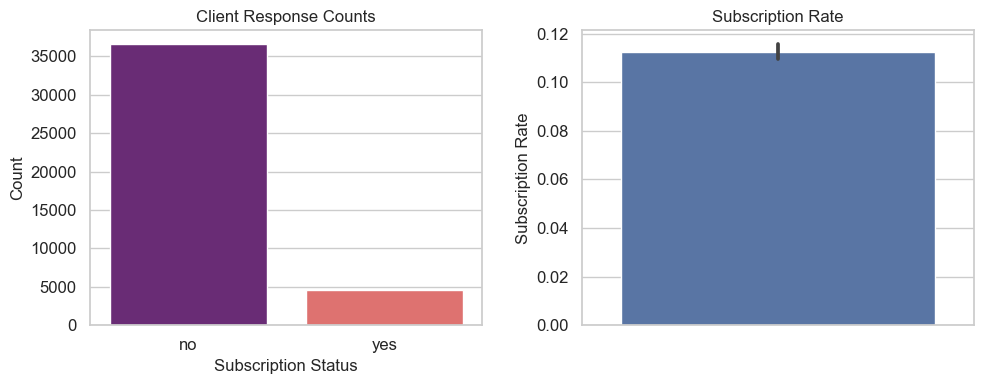

In [9]:
common_fontsize = 12

plt.figure(figsize=(10, 4))
sns.set(style="whitegrid", font_scale=1)

plt.subplot(1,2,1)
sns.countplot(data=df_edits, x='y', palette='magma')
plt.title('Client Response Counts', fontsize=common_fontsize)
plt.xlabel('Subscription Status', fontsize=common_fontsize)
plt.ylabel('Count', fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.subplot(1,2,2)
sns.barplot(data=df_viz, y='y')
plt.title('Subscription Rate', fontsize=common_fontsize)
plt.xlabel('')
plt.ylabel('Subscription Rate', fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(w_pad=2)
plt.show()

#### We will also calculate the exact subscription rate
The target column shows **imbalance** with an overall subscription rate of 11.27%

In [10]:
overall_success_rate = df_edits.y.value_counts().iloc[1]/df_edits.shape[0]
print(f"Overall success rate: {100*overall_success_rate:.2f}%")

Overall success rate: 11.27%


#### Benchmark Feature: Duration
- Duration column shows that for calls shorter than 70s, no subscriptions are made
- The mode of the duration is around 90-100s with only few clients subscribing
- As the duration increases the subscription rate increases strongly

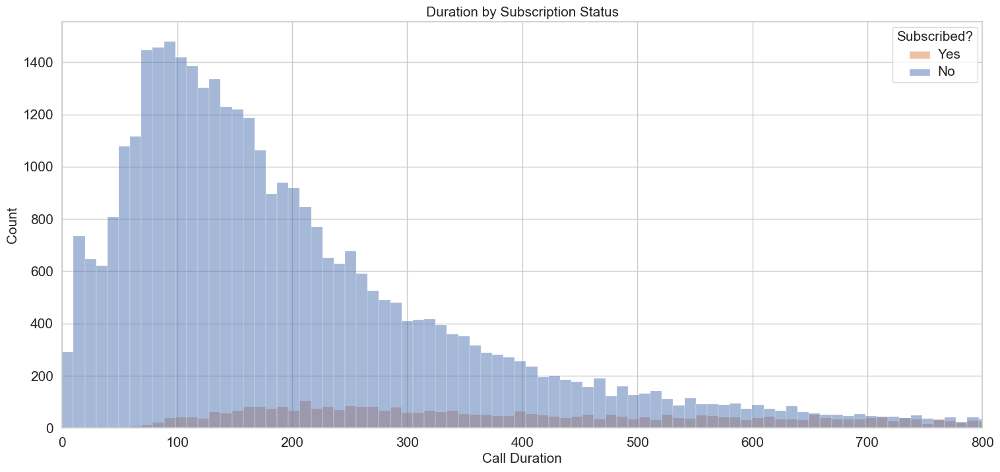

In [11]:
common_fontsize = 15

plt.figure(figsize=(18,8))
sns.set(style="whitegrid", font_scale=1)

# Create the plot
sns.histplot(data=df_edits, x='duration', hue='y', bins=500, legend=True)

# Customize labels and title
plt.title('Duration by Subscription Status', fontsize=common_fontsize)
plt.xlabel('Call Duration', fontsize=common_fontsize)
plt.ylabel('Count', fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.xlim(0, 800)

# Customize the legend
legend = plt.legend(title='Subscribed?', labels=['Yes', 'No'])
legend.get_title().set_fontsize(common_fontsize)  # Legend title fontsize
for t in legend.texts:
    t.set_fontsize(common_fontsize)  # Legend label fontsize

plt.show()

<Axes: >

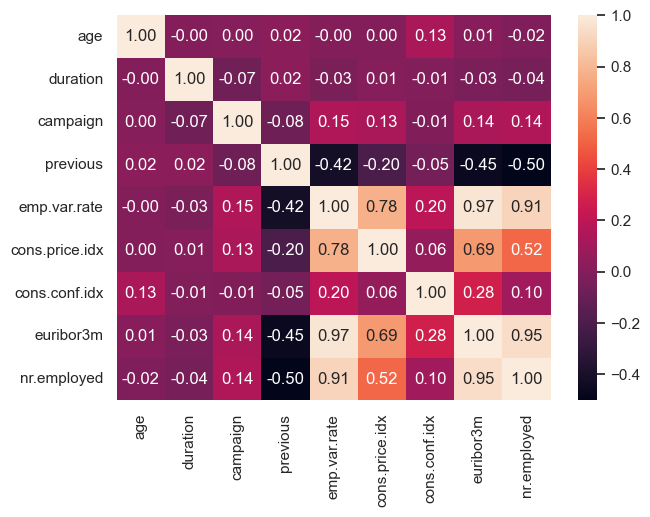

In [12]:
plt.figure(figsize=(7, 5))  
correlation_matrix = df_edits.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, fmt='.2f')
#display(correlation_matrix)

#### Subscription Rates by (Most) Features
- This first group of subplots shows features by **percentage** of subscription response (yes/no)
- Not all features are included in these subplots, however there are more plots further below

In [13]:
df_edits.sample(2)

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
39616,44,technician,married,university.degree,no,yes,no,cellular,may,fri,662,2,2,1,success,-1.8,93.876,-40.0,0.682,5008.7,yes
36142,31,admin.,married,university.degree,no,yes,no,cellular,may,wed,136,2,3,1,success,-1.8,92.893,-46.2,1.270,5099.1,no


In [14]:
subset_cols = ['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 
               'contact', 'month', 'day_of_week', 
               'campaign', 'previous', 'poutcome',
              'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 
              'nr.employed', 'y']

subset_titles = ['Age', 'Occupation', 'Marital Status', 'Education', 'Defaulted?', 'House Loan?', 'Personal Loan?',
          'Contact', 'Last Contact Month', 'Last Contact Day of Week', 
          'Number of Campaigns/Contacts', 'Number of previous contacts','Previous outcome',
          'Employment Variation Rate', 'Consumer Price Index', 'Consumer Confidence Index',
          'Number of Employees QI']

# Function to create bar plots for each feature showing the percentage of 'yes' vs 'no' for the target variable 'y'


# Generate the bar plots
plot.plot_percentage_barplots(df_edits[subset_cols], 
                         subp_titles=subset_titles, 
                         legend_title = 'Success?', 
                         figure_title = 'Percentage Distribution of Features by Subscription Status', 
                         row_height = 270)
#plot_percentage_barplots(df_edits, titles)


#### Distribution and Success Rates for Age

Text(0.1, 1.03, 'Distribution and Success Rates for Age')

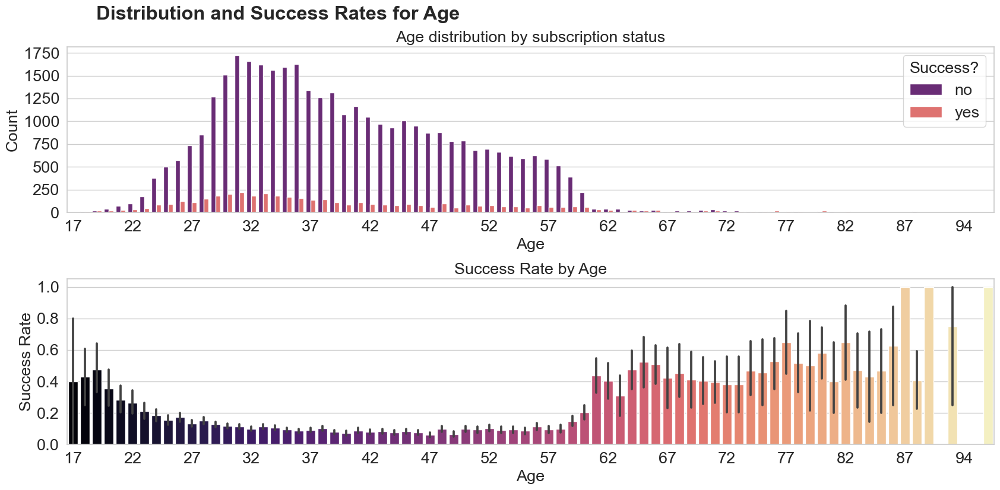

In [15]:
common_fontsize =19.5
feature_name = 'Age'
n = 5  # Show every 5th xtick

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='age',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='age',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)

plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')   

#### Distribution and Success Rates for Occupation

Text(0.1, 1.03, 'Distribution and Success Rates for Occupation')

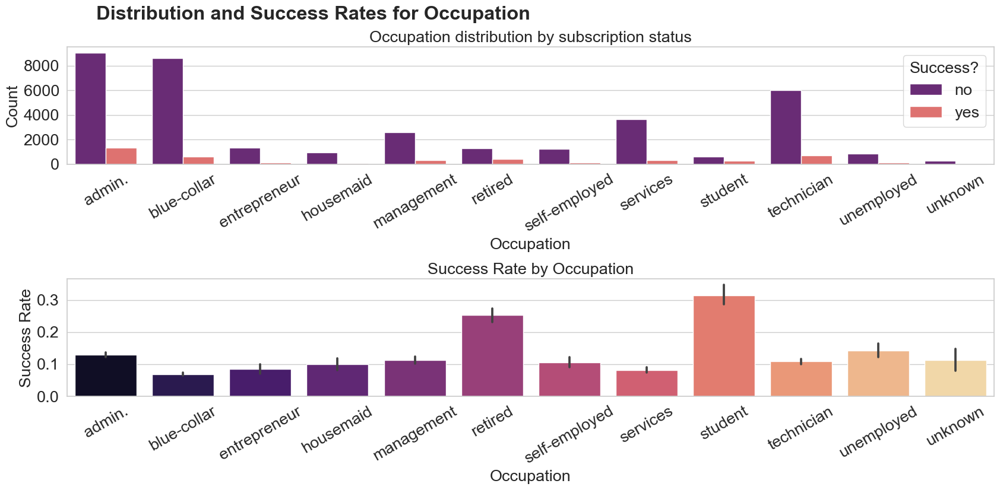

In [16]:
common_fontsize =19.5
feature_name = 'Occupation'
n = 1  # Show every 5th xtick

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='job',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize, rotation=30)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='job',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize, rotation=30)

plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')  

#### Distribution and Success Rates for Education

Text(0.1, 1.03, 'Distribution and Success Rates for Education')

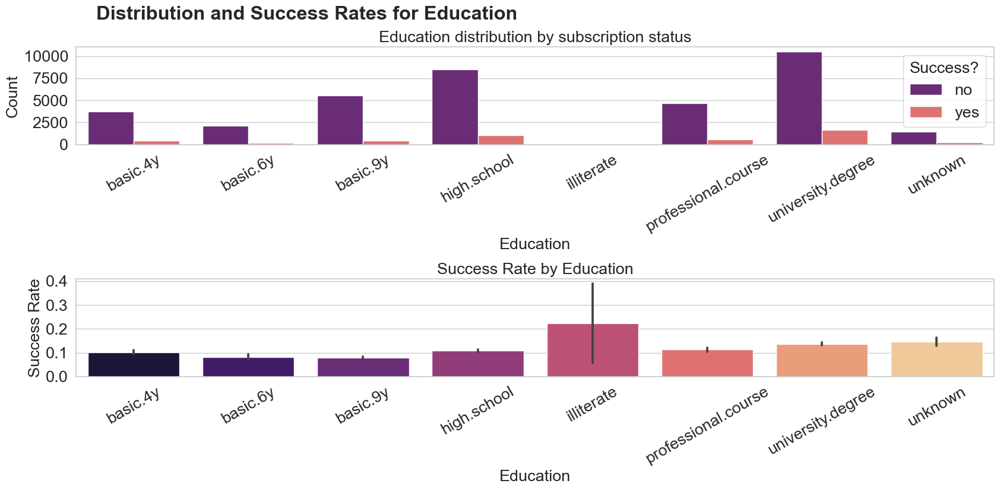

In [17]:
common_fontsize =19.5
feature_name = 'Education'
n = 1  # Show every 5th xtick

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='education',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize, rotation=30)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='education',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize, rotation=30)

plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')  

#### Distribution and Success Rates for Number of Calls During This Campaign

Text(0.1, 1.03, ' Distribution and Success Rates for Number of Calls During This Campaign')

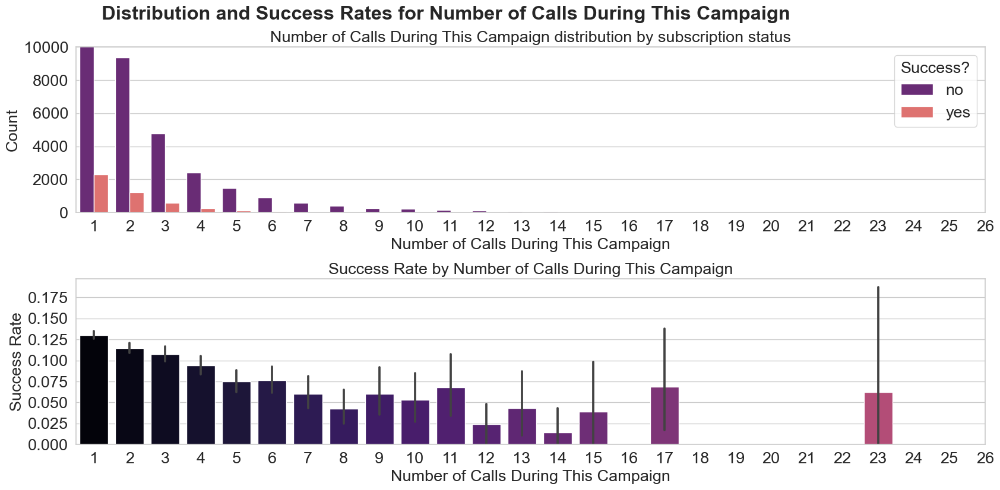

In [18]:
common_fontsize =19.5
feature_name = 'Number of Calls During This Campaign'

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='campaign',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xlim(-0.5,25)
plt.ylim(0,10_000)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='campaign',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xlim(-0.5,25)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f" Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')   

#### Distribution and Success Rates for Days since last contacted

Text(0.1, 1.03, ' Distribution and Success Rates for Days since last contacted')

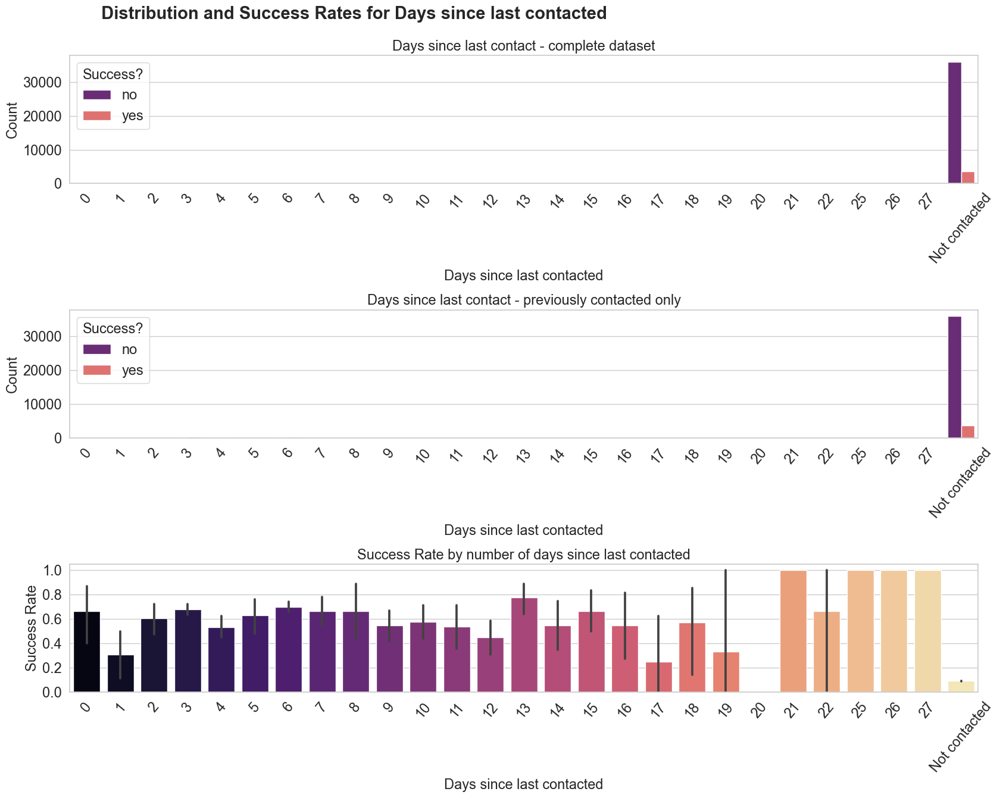

In [19]:
common_fontsize =17

plt.figure(figsize=(17, 13))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(3,1,1)
sns.countplot(data=df_edits, x='pdays',hue='y', palette='magma')
plt.title('Days since last contact - complete dataset',fontsize=common_fontsize)
plt.xlabel('Days since last contacted',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize, rotation=50)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(3, 1, 2)
sns.countplot(data=df_edits[df_edits['pdays'] !=999], x='pdays',hue='y', palette='magma')
plt.title('Days since last contact - previously contacted only',fontsize=common_fontsize)
plt.xlabel('Days since last contacted',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize, rotation=50)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(3, 1, 3)
sns.barplot(data=df_viz, x='pdays',y='y', palette='magma')
plt.title('Success Rate by number of days since last contacted',fontsize=common_fontsize)
plt.xlabel('Days since last contacted',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize, rotation=50)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f" Distribution and Success Rates for Days since last contacted", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')   

#### Distribution and Success Rates for Number of Calls from Previous Campaigns

Text(0.1, 1.03, 'Distribution and Success Rates for Number of Calls from Previous Campaigns')

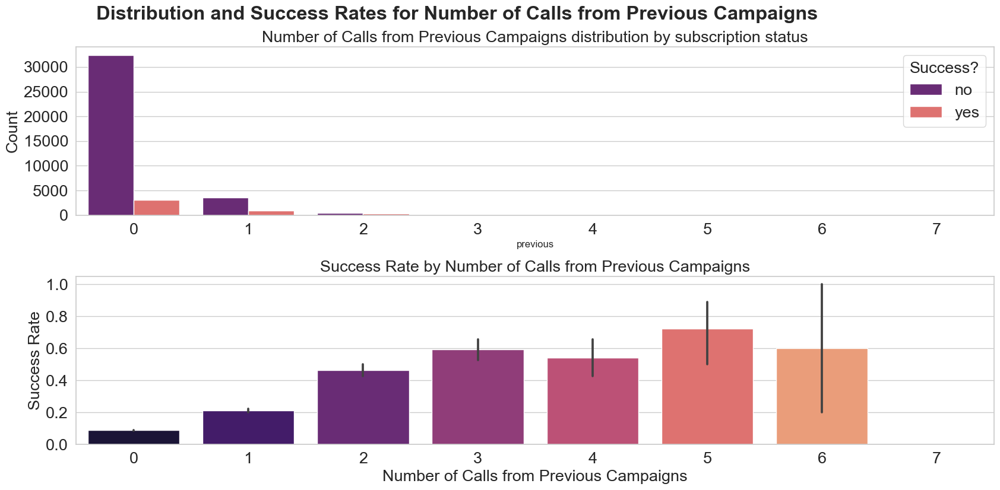

In [20]:
common_fontsize =19.5
feature_name = 'Number of Calls from Previous Campaigns'
n=1
plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='previous',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
#plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='previous',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')    

#### Distribution and Success Rates for Outcome from Previous Campaign

Text(0.1, 1.03, 'Distribution and Success Rates for Outcome from Previous Campaign')

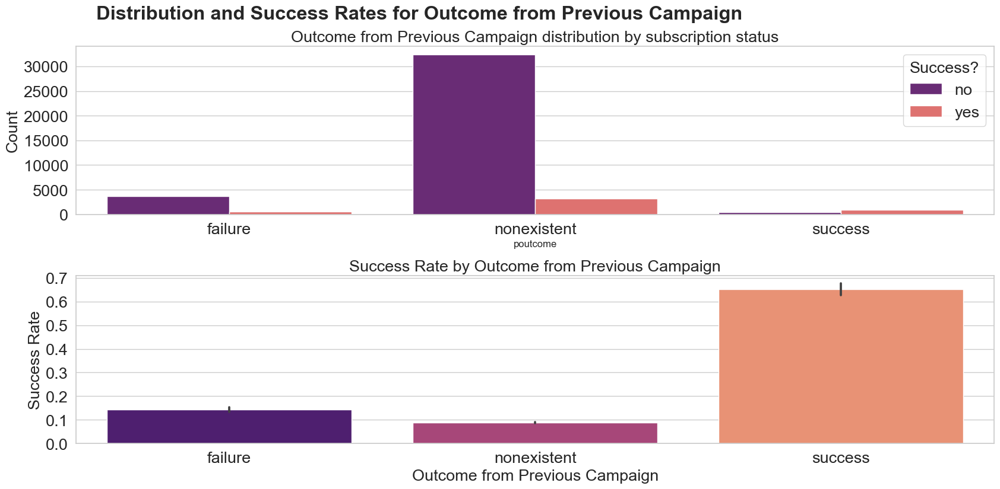

In [21]:
common_fontsize =19.5
feature_name = 'Outcome from Previous Campaign'
n=1
plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='poutcome',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
#plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='poutcome',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')    

#### Distribution and Success Rates for Outcome from Quarterly Employment Variation Rate

Text(0.1, 1.03, 'Distribution and Success Rates for Quarterly Employment Variation Rate')

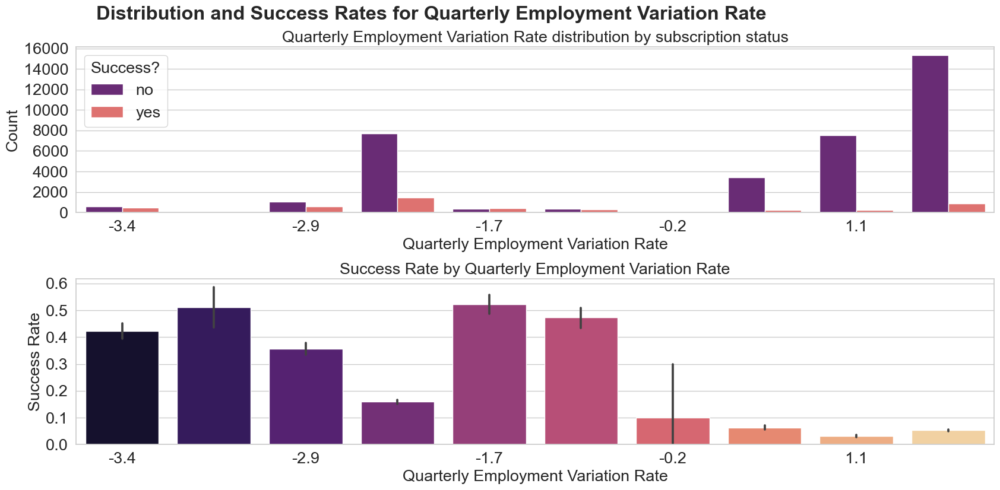

In [22]:
common_fontsize =19.5
n = 2
feature_name = 'Quarterly Employment Variation Rate'

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='emp.var.rate',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='emp.var.rate',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')    

#### Distribution and Success Rates for Outcome from Consumer Price Index

Text(0.1, 1.03, 'Distribution and Success Rates for Consumer Price Index')

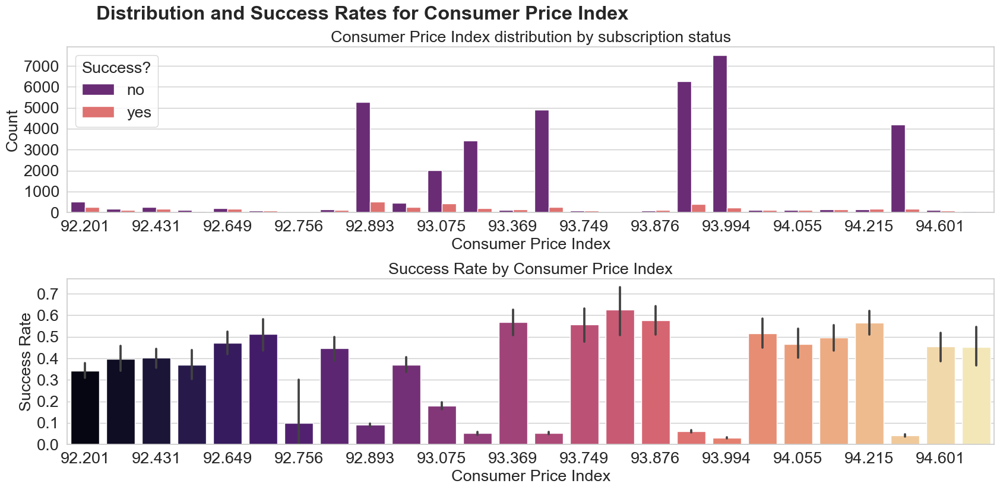

In [23]:
common_fontsize =19.5
n = 2
feature_name = 'Consumer Price Index'

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='cons.price.idx',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='cons.price.idx',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')    

#### Distribution and Success Rates for Outcome from Consumer Confidence Index

Text(0.1, 1.03, 'Distribution and Success Rates for Consumer Confidence Index')

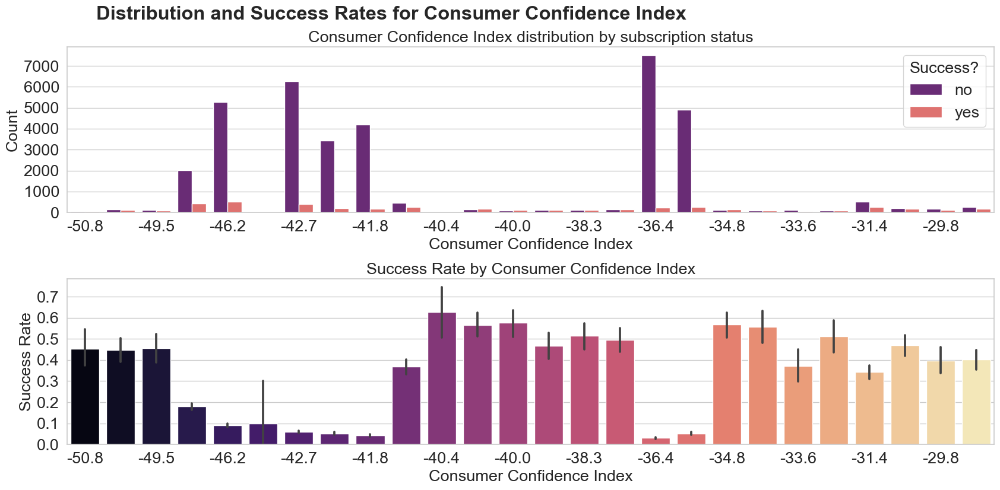

In [24]:
common_fontsize =19.5
n = 2
feature_name = 'Consumer Confidence Index'

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='cons.conf.idx',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='cons.conf.idx',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')    

#### Distribution and Success Rates for Outcome from Quarterly Number of Employees

Text(0.1, 1.03, 'Distribution and Success Rates for Quarterly Number of Employees')

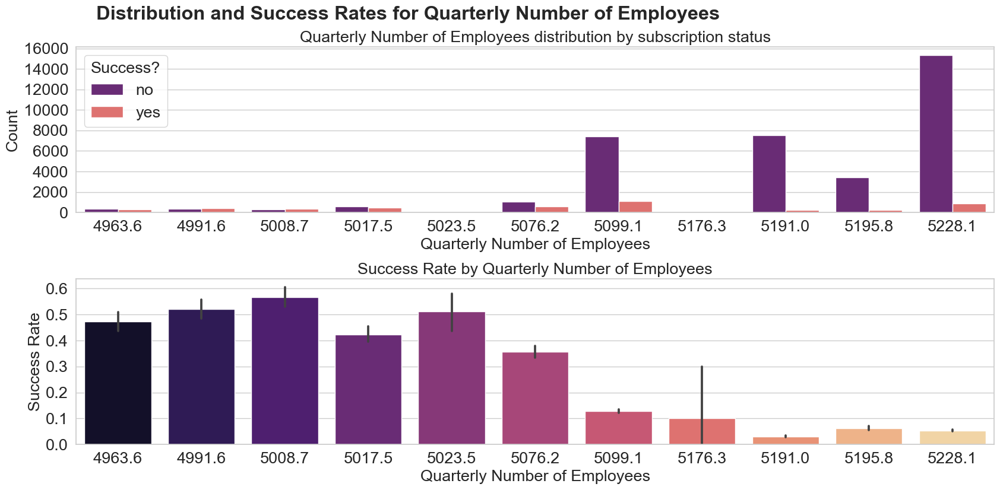

In [25]:
common_fontsize =19.5
n = 1
feature_name = 'Quarterly Number of Employees'

plt.figure(figsize=(17, 8))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,1,1)
sns.countplot(data=df_edits, x='nr.employed',hue='y', palette='magma')
plt.title(f'{feature_name} distribution by subscription status',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Count',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)
plt.legend(title='Success?', title_fontsize=common_fontsize, fontsize=common_fontsize) 

plt.subplot(2, 1, 2)
sns.barplot(data=df_viz, x='nr.employed',y='y', palette='magma')
plt.title(f'Success Rate by {feature_name}',fontsize=common_fontsize)
plt.xlabel(f'{feature_name}',fontsize=common_fontsize)
plt.ylabel('Success Rate',fontsize=common_fontsize)
plt.xticks(ticks=plt.xticks()[0][::n], labels=plt.xticks()[1][::n], fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Distribution and Success Rates for {feature_name}", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')    

#### euribor3m came out better using plotly
Below is one plot showing counts/distribution and the second showing success percentages

In [ ]:
fig = px.histogram(df_edits,x="euribor3m",color="y",barmode='overlay',
                    title="Distribution of Euriobor 3 Months Interest Rates",
                    labels={"euribor3m": "Interest Rates", "y": "Success?"},color_discrete_sequence = px.colors.qualitative.Dark24,
                   #range_x=(15,90), nbins = 76, 
                   height=450
                  )
fig.update_layout(yaxis_title="Count")
fig.show('notebook')

In [ ]:
fig = px.histogram(df_edits,x="euribor3m",color="y",barmode='overlay', histnorm='percent',
                    title="Success Percentages by Euribor 3 Months Interest Rates",
                    labels={"euribor3m": "Interest Rates", "y": "Success?"},color_discrete_sequence = px.colors.qualitative.Dark24,
                   #range_x=(15,90), nbins = 76
                   height=450
                  )
fig.update_layout(yaxis_title="Percent")
fig.show('notebook')



#### Another view of economic features using violinplots

Text(0.1, 1.03, 'Economic Metrics by Subscription Status')

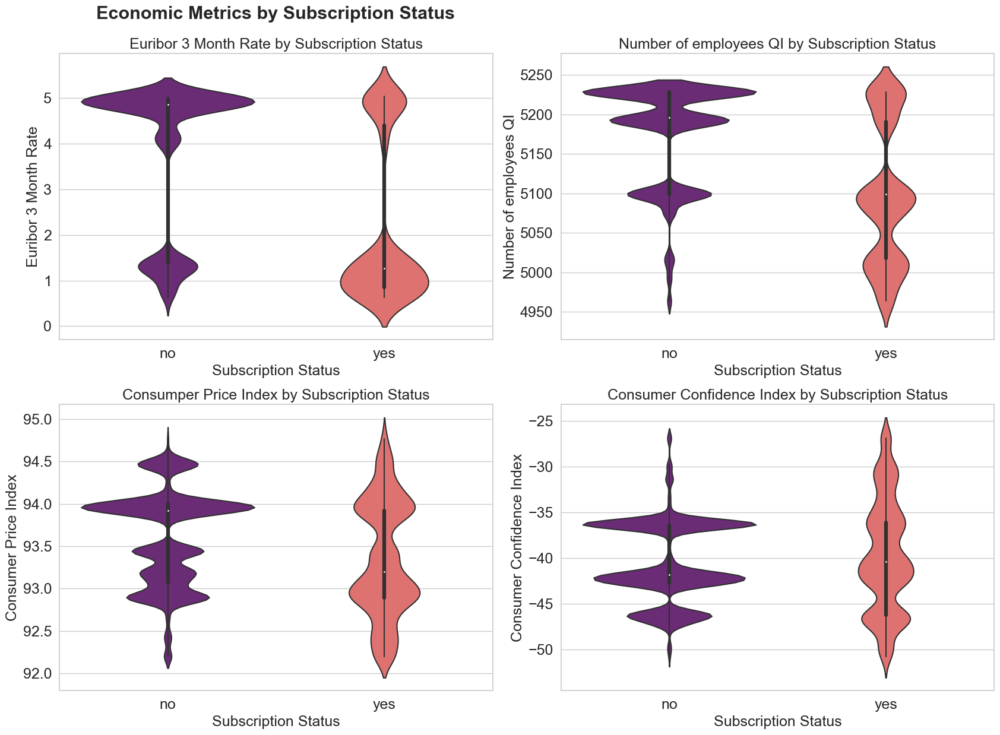

In [28]:
common_fontsize =18

plt.figure(figsize=(17, 12))  
sns.set(style="whitegrid", font_scale=1)

plt.subplot(2,2,1)
sns.violinplot(data=df_edits, x='y', y='euribor3m', palette='magma' )
plt.title('Euribor 3 Month Rate by Subscription Status',fontsize=common_fontsize)
plt.xlabel('Subscription Status',fontsize=common_fontsize)
plt.ylabel('Euribor 3 Month Rate',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.subplot(2,2,2)
sns.violinplot(data=df_edits, x='y', y='nr.employed', palette='magma' )
plt.title('Number of employees QI by Subscription Status',fontsize=common_fontsize)
plt.xlabel('Subscription Status',fontsize=common_fontsize)
plt.ylabel('Number of employees QI',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.subplot(2,2,3)
sns.violinplot(data=df_edits, x='y', y='cons.price.idx', palette='magma' )
plt.title('Consumper Price Index by Subscription Status',fontsize=common_fontsize)
plt.xlabel('Subscription Status',fontsize=common_fontsize)
plt.ylabel('Consumer Price Index',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.subplot(2,2,4)
sns.violinplot(data=df_edits, x='y', y='cons.conf.idx', palette='magma' )
plt.title('Consumer Confidence Index by Subscription Status',fontsize=common_fontsize)
plt.xlabel('Subscription Status',fontsize=common_fontsize)
plt.ylabel('Consumer Confidence Index',fontsize=common_fontsize)
plt.xticks(fontsize=common_fontsize)
plt.yticks(fontsize=common_fontsize)

plt.tight_layout(h_pad=1.09)
banner_y = 1.05
plt.suptitle(f"Economic Metrics by Subscription Status", 
                     fontsize=common_fontsize + 4, weight='bold', 
                     x=0.1, y=banner_y-0.02, ha='left')   

## Problem 3: Understanding the Features
### General Observations
- Since pdays has a value of 999 to indicate that a client was not previously contacted, treating it as a continuous variable would distort the distribution and is very likely to affect modeling performance.  We will convert the feature to categorical and update the 999s to 'Not contacted' 
- All other features of type 'object' will be converted to 'category' for more efficient memory usage and processing.  This would also allow us to define an order for visualizations. 
### Observations through Visualizations (and Pandas) 
- The target column shows **imbalance** with an overall subscription rate of 11.27%
#### Benchmark Feature: Duration
- This will not be used for modeling, however the following observations were made:
    - Duration column shows that for calls shorter than 70s, no subscriptions are made
    - The mode of the duration is around 90-100s with only few clients subscribing
    -  As the duration increases the subscription rate increases strongly
#### Heatmap correlation observations
- The economic and employment indicators have strong positive correlations with each other 
- Very low correlation among features related to the previous campaigns

#### Features that have a lot of variability in the subscription rate and are likely to have some importance: 
- ##### age
    - Highest subscription rates below ~20 and especially above ~60
    - There are very few clients above 60
    - Estimated importance: Moderate to high
- ##### default
    - Clients who previously defaulted had a 0% subscription rate
    - We note the presence of an unknown category
    - Estimated importance: High
- ##### contact
    - customers contacted on their cell phone were 3 times more likely to subscribe
    - Estimated importance: High
- ##### month
    - Estimated importance: High
- ##### campaign (number of calls during this campaign)
    - Most clients were contacted less than 8 times
    - For 1-8 campaigns, as number of Campaigns/Calls increases, subscription rate generally decreases 
    - Little to no subscriptions when client was contacted more than ~17 times
    - Estimated importance: High
- ##### pdays (days since last contacted from a previous campaign - repeat bus)
    - Vast majority of clients were clients who were never previously contacted and they had low subscription rates
    - Estimated importance: Moderate to High
- ##### previous (number of contacts performed before this campaign - prev campaign)
    - As number of previous contacts increases, the success rate generally increases
    - Estimated importance: High, Relationship is Linear 
- ##### poutcome outcome of the previous marketing campaign
    - Having been contacted in a previous campaign increases chance of success even in the event of a previous failure 
    - This feature likely has some interaction with previous and pdays
    - Estimated importance: Very high
- ##### emp.var.rate
    - As employment variation rate increases past ~-0.5, success rates fall drastically even though banks have tried harder to make more calls 
    - Estimated importance: Moderate to high
- ##### cons.price.idx and cons.conf.idx
    - These features show some variations 
    - Estimated importance: Moderate
- ##### nr.employed
    - As the number of employees increases we see a general decrease in success rates
    - Somewhat linear relationship with target
    - Estimated importance: Moderate

#### Features that have less variability in subscription rates and likely to play a lesser role:
- ##### job
- ##### marital
- ##### education
- ##### housing
- ##### loan
- ##### day_of_week

### Problem 4: Understanding the Task

After examining the description and data, your goal now is to clearly state the *Business Objective* of the task.  State the objective below.

#### Business Objective:
Find a model that can explain the success of a contact i.e. will the client subscribe to a deposit? 
By identifying the main characterstics that affect success of a contact, the bank can increase its marketing efficiency and achieve a given number of successes for a lesser number of contacts thus saving time and resources

The selected model will be evaluated against 3 criteria:
- **Performance**
    - We will use a carefully selected scoring metric and consider train/inference time
- **Explainable**
     - Ability to identify the most important features and explain their impact on the target.  We may do this through one or more of the following:
     - Using model coefficients
     - Using Partial Dependence and ICE Plots
     - Model representations
     - LIFT curves
     - CounterFactuals
 
- **Actionable Results**
    - Will our results provide clear direction to the bank marketing team on how to improve campaign efficiency?  

### Problem 5: Engineering Features

Now that you understand your business objective, we will build a basic model to get started.  Before we can do this, we must work to encode the data.  Using just the bank information features (columns 1 - 7), prepare the features and target column for modeling with appropriate encoding and transformations.

In [59]:
#Copy dataframe selecting only columns 1-7 and provide meaningful name: df_client 
df_client = df_edits.copy().iloc[:,0:7]
#Define X and y
X,y=df_client, df_edits.y
df_client.sample(2)

,age,job,marital,education,default,housing,loan
26868,29,admin.,single,university.degree,no,yes,no
22176,29,admin.,single,university.degree,no,yes,no


##### Encoding choice
Job has the highest number of dimensions (which is 12), and we have a large dataset (40k+ samples), so our cardinality is not very high.  Because of this and because we are only looking at 7 features, we will use one hot encoding for all categorical features.

In [60]:
#Define columns to be OneHotEncoded
ohe_cols= tools.select_all_col_names_except(df_client, ['age'])
ohe_cols

['housing', 'default', 'education', 'loan', 'job', 'marital']

Having done a bit of reaearch/reading [from this article from inmachineswetrust](https://inmachineswetrust.com/posts/drop-first-columns/), we will not use drop = if_binary for now because we are likely to use regularization and/or non-linear models

In [61]:
#Define Transformer with PolynomialFeatures and SFS
simple_transformer = ColumnTransformer(
    transformers=[
        ('ohe', OneHotEncoder(drop='if_binary', sparse_output=False), ohe_cols),
    ], remainder='passthrough')

#Test transformer
simple_transformer.fit(X,y)

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 OneHotEncoder(drop='if_binary',
                                               sparse_output=False),
                                 ['housing', 'default', 'education', 'loan',
                                  'job', 'marital'])])

### Problem 6: Train/Test Split

With your data prepared, split it into a train and test set.

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X,y, stratify=y, random_state=42)

In [63]:
X_train.shape, X_test.shape

((30891, 7), (10297, 7))

### Problem 7: A Baseline Model

Before we build our first model, we want to establish a baseline.  What is the baseline performance that our classifier should aim to beat?

We will use a DummyClassifier with default settings. Also we will use the default score method which is accuracy which also models the metric from model 9 so this makes sense to be able to compare scores.

In [64]:
from sklearn.dummy import DummyClassifier
dummy_clf = DummyClassifier().fit(X_train, y_train)

In [65]:
dummy_train_score = dummy_clf.score(X_train, y_train)
dummy_test_score = dummy_clf.score(X_test, y_test)
dummy_train_score, dummy_test_score

(0.8873458288821987, 0.8873458288821987)

### Problem 8: A Simple Model

Use Logistic Regression to build a basic model on your data.  

In [66]:
simple_pipeline = Pipeline([
    ('transformer', simple_transformer), 
    ('scaler', StandardScaler()), 
    ('classifier', LogisticRegression() )
])

#test pipeline 
simple_pipeline.fit(X_train,y_train)

Pipeline(steps=[('transformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  OneHotEncoder(drop='if_binary',
                                                                sparse_output=False),
                                                  ['housing', 'default',
                                                   'education', 'loan', 'job',
                                                   'marital'])])),
                ('scaler', StandardScaler()),
                ('classifier', LogisticRegression())])

### Problem 9: Score the Model

What is the accuracy of your model?

In [67]:
simple_pipeline.score(X_train, y_train), simple_pipeline.score(X_test, y_test)

(0.8873458288821987, 0.8873458288821987)

### Problem 10: Model Comparisons

Now, we aim to compare the performance of the Logistic Regression model to our KNN algorithm, Decision Tree, and SVM models.  Using the default settings for each of the models, fit and score each.  Also, be sure to compare the fit time of each of the models.  Present your findings in a `DataFrame` similar to that below:

| Model | Train Time | Train Accuracy | Test Accuracy |
| ----- | ---------- | -------------  | -----------   |
|     |    |.     |.     |

In [85]:
# Define models 
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'KNN': KNeighborsClassifier(),
    'Decision Trees': DecisionTreeClassifier(random_state=42),
    'SVM': SVC(probability=True, random_state=42)
}

In [87]:
# Initialize dictionaries to store results
results = {
    'Model': [],
    'Train Time': [],
    'Inference Time': [],
    'Train Accuracy': [],
    'Test Accuracy': [],
    'Train Precision': [],
    'Test Precision': [],
    'Train Recall': [],
    'Test Recall': [],
    'Train f1': [],
    'Test f1': [],
    'Train ROC AUC': [],
    'Test ROC AUC': []
}


import time
for model_name, model in models.items():
    
    #Take start timestamp for training
    start_time = time.time()
    pipeline = Pipeline([
    ('transformer', simple_transformer), 
    ('scaler', StandardScaler()), 
    (model_name, model)
    ]).fit(X_train, y_train)
    
    #Take end timestamp for training
    train_time = time.time() - start_time
    
    #Take start timestamp for test inference
    start_time = time.time()
    y_test_pred = pipeline.predict(X_test)
    #Take end timestamp for test inference 
    inference_time = time.time() - start_time
    
    test_accuracy = accuracy_score(y_test, y_test_pred)
    
    y_train_pred = pipeline.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)

    train_precision = precision_score(y_train, y_train_pred, average='weighted')
    train_recall = recall_score(y_train, y_train_pred, average='weighted')
    train_f1 = f1_score(y_train, y_train_pred, average='weighted')    
    y_train_prob = pipeline.predict_proba(X_train)[:, 1]  
    train_roc_auc = roc_auc_score(y_train, y_train_prob)
 
    
    test_precision = precision_score(y_test, y_test_pred, average='weighted')
    test_recall = recall_score(y_test, y_test_pred, average='weighted')
    test_f1 = f1_score(y_test, y_test_pred, average='weighted')
    y_test_prob = pipeline.predict_proba(X_test)[:, 1] 
    test_roc_auc = roc_auc_score(y_test, y_test_prob)

    results['Model'].append(model_name)
    results['Train Time'].append(train_time)
    results['Inference Time'].append(inference_time)
    results['Train Accuracy'].append(train_accuracy)
    results['Test Accuracy'].append(test_accuracy)
    results['Train Precision'].append(train_precision)
    results['Test Precision'].append(test_precision)
    results['Train Recall'].append(train_recall)
    results['Test Recall'].append(test_recall)
    results['Train f1'].append(train_f1)
    results['Test f1'].append(test_f1)
    results['Train ROC AUC'].append(train_roc_auc)
    results['Test ROC AUC'].append(test_roc_auc)
    
results_df=pd.DataFrame(results)
results_df

,Model,Train Time,Inference Time,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train f1,Test f1,Train ROC AUC,Test ROC AUC
0,Logistic Regression,0.119251,0.019095,0.887346,0.887346,0.787383,0.787383,0.887346,0.887346,0.834381,0.834381,0.650991,0.655391
1,KNN,0.071458,0.314137,0.891295,0.879285,0.863257,0.827700,0.891295,0.879285,0.858101,0.841895,0.787629,0.589181
2,Decision Trees,0.114184,0.011523,0.917775,0.866660,0.918043,0.819671,0.917775,0.866660,0.898328,0.837736,0.919315,0.579354
3,SVM,77.955108,7.972764,0.887670,0.887152,0.879236,0.825048,0.887670,0.887152,0.835356,0.834660,0.637109,0.560314


### Problem 11: Improving the Model

Now that we have some basic models on the board, we want to try to improve these.  Below, we list a few things to explore in this pursuit.

- More feature engineering and exploration.  For example, should we keep the gender feature?  Why or why not?
- Hyperparameter tuning and grid search.  All of our models have additional hyperparameters to tune and explore.  For example the number of neighbors in KNN or the maximum depth of a Decision Tree.  
- Adjust your performance metric

In [ ]:
We would want our model to have explainable 





In [ ]:
#Define Transformer with PolynomialFeatures and SFS
transformer = ColumnTransformer(
    transformers=[
        ('poly', PolynomialFeatures(include_biase=False), ['age']), 
        ('ohe', OneHotEncoder(drop='if_binary', sparse_output=False)),
    ], remainder='passthrough')

#transformer_params = {'transformer__poly__degree': [1,2,3]}

selector =  ('selector', SequentialFeatureSelector(estimator=RandomForestClassifier()))

In [ ]:
#### Updating our Performance Metric

#### Feature Engineering
Since this is a large dataset, we want to try figure out which features are the most important

#### Randomized Search

##### Questions